# Market research of eating places in Moscow

## Scope of the project

**The goal**:
- Conduct market research of restaurants in Moscow

**Input data**: 
- We have open-source data about cafes in Moscow as of summer 2022

**Analysis structure**:
* Data overview
* Data preparation
* EDA
* Preliminary results
* Details: opening a coffee shop
* Results

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
import re
from io import BytesIO
import requests
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json

In [2]:
# set options

pd.options.display.float_format = '{:.2f}'.format
pd.options.display.max_colwidth = 210

## Data overview

In [3]:
# upload data

try:
    df = pd.read_csv('/datasets/moscow_places.csv')
except:
    df = pd.read_csv('moscow_places.csv')

### General view

In [4]:
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


There are 13 columns in the dataframe:

* name: name of the place
* category: type of the place
* address: address of the place
* district: area where the place is located
* hours: working hours of the place
* lat: latitude of the place
* lng: longitude of the place
* rating: rating of the place
* price: descriptive price range in the place (average, above average, below average, and etc.)
* avg_bill: price range of the average bill depending on the type of the place
* middle_avg_bill: median of the price range from avg_bill column; only if starts with "Средний счет"
* middle_coffee_cup: median of the price range from avg_bill column; only if starts with "Цена чашки капучино"
* chain: whether a part of the chain; 0 or 1
* seats: number of seats in the place

In [6]:
print(f'There are {len(df)} entries.')

There are 8406 entries.


In [7]:
df.nunique()

name                 5614
category                8
address              5753
district                9
hours                1307
lat                  8209
lng                  8258
rating                 41
price                   4
avg_bill              897
middle_avg_bill       230
middle_coffee_cup      96
chain                   2
seats                 229
dtype: int64

* There are 5614 distinct object names, we believe this is due to being part of the chain; we check it further
* There are 5753 distinct addresses, meaning that there are some clusters with eating places (like business centers or shopping malls)
* There are 8 types of eating places
* Those places are located in 9 districts

In [8]:
df['chain'].value_counts()

0    5201
1    3205
Name: chain, dtype: int64

* There are less objects which are not part of the chain than the distinct number of the objects' names, which sounds reasonable

## Data preparation

### Missing values

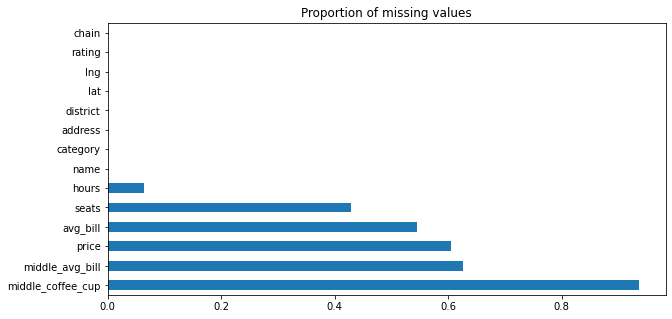

In [9]:
# creates a chart with proportion of missing values

(
    df
     .isna()
     .mean()
     .sort_values(ascending=False)
     .plot(kind='barh', figsize=(10,5), legend=False, title='Proportion of missing values')
);

For missing values in `hours`, `seats`, and `price` we can not do anything.

For other missing values we can check whether we can get any data from `middle_avg_bill` and `middle_coffee_cup` for `avg_bill`; if not, then there is also nothing to do with this, unfortunately 

In [10]:
# get help df with only rows where data is missing in avg_bill column

df_check = df[df['avg_bill'].isna()]

In [11]:
# check for missing values in connected columns

df_check[['avg_bill', 'middle_avg_bill', 'middle_coffee_cup']].isna().mean()

avg_bill            1.00
middle_avg_bill     1.00
middle_coffee_cup   1.00
dtype: float64

* As we can see, when there are missing values in `avg_bill`, they are also missing in `middle_avg_bill` and `middle_coffee_cup`
* So, we can't extract any data from there 

Then, we leave missing values as it is as applying average or median values would not give us any valueable insights.

### General duplicates

In [12]:
# general check for full duplicates

df.duplicated().sum()

0

There are no full duplicates

In [13]:
# one more check just for the basic info about the place

df[['name', 'category', 'address']].duplicated().sum()

0

* There are also no duplicates if taking into account only names, categories, and addresses
* There might be duplicated due to the case sensitivity

In [14]:
# kill case sensitivity in names

df['name'] = df['name'].str.lower()

In [15]:
df[['name', 'address']].duplicated().sum()

3

In [16]:
df[df[['name', 'address']].duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.81,37.50,4.20,NaN,NaN,NaN,NaN,1,188.00
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.81,37.64,4.40,NaN,NaN,NaN,NaN,1,150.00
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.74,37.41,4.10,NaN,NaN,NaN,NaN,0,276.00


There are only 3 implicit duplicates which we delete.

In [17]:
# drop implicit duplicates

df = df[~df[['name', 'address']].duplicated()]

### Getting street names from addresses

In [18]:
words = ['проезд','шоссе','улица','переулок','микрорайон','мкад','проспект','пр.',
         'площадь','аллея','бульвар','набережная','сквер','тупик','линия','территория',
         'квартал','просек', 'парк', 'заказник' , 'мост']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

In [19]:
df['street'] = df['address'].str.extract(str_pat, flags=re.I)

In [20]:
df['street'].isna().sum()

135

In [21]:
df[df['street'].isna()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.88,37.46,4.30,NaN,NaN,NaN,NaN,1,NaN,NaN
60,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.90,37.57,4.90,NaN,NaN,NaN,NaN,1,NaN,NaN
64,testo мания,кофейня,"Москва, Лианозовский парк культуры и отдыха",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.90,37.57,4.10,NaN,NaN,NaN,NaN,0,NaN,NaN
73,веранда,ресторан,"Москва, парк Алтуфьево",Северо-Восточный административный округ,"пн-пт 11:00–22:00; сб,вс 11:00–23:00",55.91,37.58,4.20,NaN,NaN,NaN,NaN,1,NaN,NaN
137,get and fly,ресторан,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.88,37.53,4.10,NaN,NaN,NaN,NaN,0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8259,гренки,кафе,"Москва, Юго-Восточный административный округ, район Кузьминки",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.69,37.77,4.90,NaN,NaN,NaN,NaN,0,NaN,NaN
8262,лесной,кафе,"Москва, Юго-Восточный административный округ, район Кузьминки",Юго-Восточный административный округ,"пн-пт 11:00–22:00; сб,вс 11:00–23:00",55.69,37.78,4.90,NaN,NaN,NaN,NaN,0,NaN,NaN
8266,беседка,кафе,"Москва, Юго-Восточный административный округ, район Кузьминки",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.69,37.79,4.20,NaN,NaN,NaN,NaN,1,NaN,NaN
8360,сетевое кафе,кафе,"Москва, Юго-Восточный административный округ, район Кузьминки",Юго-Восточный административный округ,"ежедневно, 10:00–23:00",55.69,37.78,3.30,NaN,NaN,NaN,NaN,0,NaN,NaN


We have not managed to get the street names for places that are mostly in parks or with no exact address, i.e. just district within admin areas.
Those places are only around 2% of cases, so we leave it as it is.

### Creating column with flag for 24/7 places

In [22]:
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')

In [23]:
df['is_24/7'].sum()

730

There are only 730 places that work both 24 hours and 7 days in a week.

### Results

* We have tried to work around with some missing values but in the end left it as it is. We have neither dropped any missing values, nor enriched it with averages or medians as it would not bring any valueable insights.
* We have deleted duplicated entries; there were only 3 of them
* We have extracted street names from addresses for 98% of cases; for the missing ones we left it as is due to inability to get
* We have also flagged the 24/7 working places

## EDA

### Distribution by object type

In [24]:
# creates a df slice with distribution by type

data = df['category'].value_counts().sort_values(ascending=False).to_frame('counts').reset_index()

In [25]:
# calc proportions of each category to total
 
data['proportion'] = round(data['counts'] / data['counts'].sum() * 100, 2)

In [26]:
# creates chart with distribution by type

fig = px.bar(data, 
             y='counts', 
             x='index', 
             text_auto=True, 
             text='proportion', 
             title="Distribution by object type",
             labels={'counts':'number of places', 'index': 'category'})
fig.show()

* Cafes are by far the biggest object type – it's in around 28% of cases
* The second biggest category is restaurants - a bit more than 24%
* Coffee places are in almost 17% of cases in dataset 
* The less frequent type is the bakery: just 3% of cases

### Number of seats by object type

In [27]:
# creates a slice of df with mean number of seats by object type

data = (
    df
    .groupby('category')['seats']
    .agg(['mean', 'median'])
    .sort_values(by='mean', ascending=False)
    .reset_index()
)

In [28]:
# creates a chart with mean number of seats by object type

fig = px.bar(data, 
             y='mean', 
             x='category', 
             text_auto='.0f',
             text='median',
             title="Average number of seats by object type",
             labels={'mean':'average number of seats', 'median': 'median number of seats'})
fig.show()

* Surprisingly, there is not a huge range of average seats in different categories 
* Unexpectedly, bars and pubs have the highest number of average seats per place with 124, while canteens (that are usually very large) lag with only 100 seats on average
* Restaurants are having the second highest average number of seats with 122 
* The smallest type is bakery but still with almost 90 seats on average! 

In [29]:
data

,category,mean,median
0,"бар,паб",124.48,82.00
1,ресторан,121.89,86.00
2,кофейня,111.20,80.00
3,столовая,99.75,75.50
4,быстрое питание,98.89,65.00
5,кафе,97.37,60.00
6,пиццерия,94.50,55.00
7,булочная,89.39,50.00


* We see that median seat numbers are significantly lower than average ones which states that there are some big outliers with very high number of seats 
* But it is still strange that the category with lowest median seats, i.e. bakery, still has so many seats in 50% of cases

### Distribution by chain

In [30]:
# change flag in df for a chain to str

df['chain'].replace(to_replace=0, value='not a chain', inplace=True)
df['chain'].replace(to_replace=1, value='chain', inplace=True)

In [31]:
# creates a slice of df with distribution by chain

data = df['chain'].value_counts().sort_values(ascending=False).to_frame('counts').reset_index()

In [32]:
# calc proportions to total

data['proportion'] = round(data['counts'] / data['counts'].sum() * 100, 1)

In [33]:
# creates chart with distribution by chain

fig = px.bar(data, 
             y='counts', 
             x='index', 
             text_auto=True, 
             text='proportion', 
             title="Distribution by chain",
             labels={'counts':'number of places', 'index': 'whether a chain'})
fig.show()

* around 62% of places are not part of the food chain
* a bit more than 38% are forming chains

In [34]:
# group df by object type and chain and get proportions within each type

data = df.groupby(['category', 'chain'])['name'].count().reset_index()
data['type_sum'] = data.groupby('category')['name'].transform('sum')
data['proportion'] = data['name'] / data['type_sum']
data = data.sort_values(by=['chain', 'proportion'])

In [35]:
# create a chart with proportions in each object type wheather a chain

fig = px.bar(data, 
                   x="category", 
                   y="proportion",
                   color='chain', 
                   barmode='group',
                   text_auto='.0%',
                   title='Distribution by object type and chain',
                   labels={'proportion':'%'}
                  )
fig.show()

* When broken down by object type, bakeries, pizza places, and coffee shops have the highest proportion of being a part of the chain
* Cafes, Canteens, and bars/pubs are the most independent ones, not being a part of the chain

### Top-15 chains

In [36]:
# creates a slice of df with top-15 chain objects

data = (
    df
    .query('chain == "chain"')
    .groupby('name')['name']
    .count()
    .sort_values(ascending=False)
    .head(15)
    .to_frame('counts')
    .reset_index()
    )

In [37]:
# creates chart with top-15 chain objects

fig = px.bar(data, 
             y='counts', 
             x='name', 
             text_auto=True,  
             title="Top-15 chains",
             labels={'counts':'number of places'})
fig.show()

* The biggest chain in dataset is "Шоколадница" with 120 places
* Next 3 chains have around 75 places

In [38]:
# function to flag whether a part of top-15 chains

def top_15_chains(row):
    name = row['name']
    chain = row['chain']
    if name in set(data['name']) and chain=='chain':
        return 'yes'

In [39]:
# applying a function

df['top_15_chains'] = df.apply(top_15_chains, axis=1)

In [40]:
# sanity check

df['top_15_chains'].value_counts()

yes    816
Name: top_15_chains, dtype: int64

In [41]:
data['counts'].sum()

816

In [42]:
# creates a slice with only top-15 chains places

data = df.query('top_15_chains == "yes"')

In [43]:
# creates a chart with distribution by category over districts for places in top-15 chains

fig = px.histogram(data, 
                   x="category", 
                   y="district",
                   color='district',
                   histfunc='count',
                   title='Distribution by category over districts for places in top-15 chains',
                   height=800,
                   labels={'count': 'Number of places'}
                  )

fig.update_xaxes(categoryorder='total descending')
fig.show()

* Within top-15 chains coffee shops are the biggest category with around 330 places
* Restauraunts, pizzerias, and caffees are following by
* For coffee shops, restauraunts, and caffees the most of the places are located in Central admin area

### Distribution by districts

In [44]:
# creates stacked plot with distribution over districts

fig = px.histogram(df, 
                   x="district", 
                   y="name",
                   color='category',
                   histfunc='count',
                   title='Distribution by category over districts',
                   height=800,
                   labels={'count': 'Number of places'}
                  )

fig.update_xaxes(categoryorder='total descending')
fig.show()

### Average rating over categories

In [45]:
# creates a slice with average rating over categories

data = df.groupby('category')['rating'].mean().sort_values(ascending=False).reset_index()

In [46]:
# creates chart with average rating over categories

fig = px.bar(data,
             x='category',
             y='rating',
             title='Average rating over categories',
             text_auto='.2f',
             labels={'rating': 'average rating'}
            )

fig.update_yaxes(range = [4, 4.5])
fig.show()

* Bars/pubs have the highest average ratings
* Fast food places are rated the lowest on average
* The ratings are in range of around 4-4,4 which is high 

### Choropleth with average ratings over districts

In [47]:
# get geo data

try:
    with open('/datasets/admin_level_geomap.geojson', 'r') as f: 
        state_geo = json.load(f)
except:
    with open('admin_level_geomap.geojson', 'r') as f:
        state_geo = json.load(f)

In [48]:
# setting coordinates for Moscow center
moscow_lat, moscow_lng = 55.751244, 37.618423

# create map
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [49]:
# group by districts 

rating_data = df.groupby('district', as_index=False)['rating'].agg('mean')

In [50]:
# create Choropleth and add to the map
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.3,
    legend_name='Average rating over districts',
).add_to(m);

In [51]:
# show map with Choropleth
m

### Places clusters on the map

In [52]:
# setting coordinates for Moscow center
moscow_lat, moscow_lng = 55.751244, 37.618423

# create map
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [53]:
# add empty cluster on map
marker_cluster = MarkerCluster().add_to(m)

In [54]:
# create function that gets markers for each place in dataset and add it to the cluster

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

In [55]:
# applying create_clusters() to each row of dataframe
df.apply(create_clusters, axis=1)

# show map
m

### Top-15 streets by number of objects

In [56]:
# create a slice with top-15 streets

data = df.groupby('street')['name'].count().sort_values(ascending=False).reset_index().head(15)

In [57]:
# function to flag whether a part of top-15 streets

def top_15_streets(row):
    name = row['street']
    if name in set(data['street']):
        return 'yes'

In [58]:
# applying a function

df['top_15_streets'] = df.apply(top_15_streets, axis=1)

In [59]:
# sanity check

df['top_15_streets'].value_counts()

yes    1255
Name: top_15_streets, dtype: int64

In [60]:
data['name'].sum()

1255

In [61]:
# creates a slice with only top-15 streets places

data = df.query('top_15_streets == "yes"')

In [62]:
# creates a chart with distribution by category over districts for places in top-15 chains

fig = px.histogram(data, 
                   x="street", 
                   y="name",
                   color='category',
                   histfunc='count',
                   title='Distribution by category over districts for places in top-15 chains',
                   height=800,
                   labels={'count': 'Number of places'}
                  )

fig.update_xaxes(categoryorder='total descending')
fig.show()

* Surprisingly, the streets full of eating places are not in the very center of Moscow
* This might be explained by the fact that the above streets are super long compared to short ones in the very center
* The biggest number of objects is on "проспект Мира": around 180 places
* "Профсоюзная улица" is catching up with around 120 places
* Top-15 street is "Пятницкая улица" with around 50 objects

### Streets with only 1 object on the street

In [63]:
# get streets with just 1 place

data = df.groupby(['street', 'district'])['name'].count().to_frame('counts').reset_index().query('counts == 1')

print(f'There are {data["counts"].sum()} streets with just 1 object on the street')

There are 443 streets with just 1 object on the street


In [64]:
# calc number of streets with just 1 place in the street for each district

data_1 = data.groupby('district')['counts'].sum().sort_values(ascending=False).to_frame('sum').reset_index()

In [65]:
# create chart with districts with 1 object on 1 street

fig = px.bar(data_1,
             x='district',
             y='sum',
             title='Districts with 1 object on 1 street',
             text_auto=True,
             labels={'sum': 'Number of streets with 1 object on the street'}
             )

fig.show()

* Surprisingly, the Central admin area has the highest number of streets with just 1 place on the street
* This might be due to the highest prices for rent in this area and due to the short streets
* Norht-West and South-West admin areas have the lowest number of such streets - only 20 and 15 streets, respectively

### Choropleth with median average bills

In [66]:
# setting coordinates for Moscow center
moscow_lat, moscow_lng = 55.751244, 37.618423

# create map
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [67]:
# group by districts 

median_avg_bill = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')

In [68]:
# create Choropleth and add to the map
Choropleth(
    geo_data=state_geo,
    data=median_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.3,
    legend_name='Median average bill over districts',
).add_to(m);

In [69]:
# show map with Choropleth
m

## Preliminary results

We have conducted a market research on the public data for eating places in Moscow.  

Some findings up to now:
* Cafes are the most popular places (around 28% of all the objects; around 2,4k places)
* Surprisingly, there is not a huge range of average seats in different categories 
* Unexpectedly, bars and pubs have the highest number of average seats per place with 124, while canteens (that are usually very large) lag with only 100 seats on average
* Around 60% of places are not part of the food chain
* When broken down by object type, bakeries, pizza places, and coffee shops have the highest proportion of being a part of the chain
* Cafes, Canteens, and bars/pubs are the most independent ones, not being a part of the chain
* The biggest chain in dataset is "Шоколадница" with 119 places
* Top-15 chain list mostly includes coffee shops, pizza places, and some restauraunts
* Bars/pubs have the highest average ratings
* Fast food places are rated the lowest on average
* Surprisingly, the streets full of eating places are not in the very center of Moscow
* This might be explained by the fact that the above streets are super long compared to short ones in the very center
* The biggest number of objects is on "проспект Мира": around 180 places
* The Central admin area has the highest number of streets with just 1 place on the street
* This might be due to the highest prices for rent in this area and due to the short streets


## Opening a coffee shop 

### EDA

In [70]:
# slice df for coffee shops

df_coffee = df.query('category == "кофейня"')

In [71]:
# get total number of coffee shops

print(f'Total number of coffee shops in dataset is {len(df_coffee)}')

Total number of coffee shops in dataset is 1413


In [72]:
# get distribution by districts

data = df_coffee.groupby('district')['name'].count().sort_values(ascending=False).to_frame('counts').reset_index()
data['proportion'] = round(data['counts'] / data['counts'].sum() * 100, 2)

In [73]:
# creates a chart with distribution by districts

fig = px.bar(data,
             x='district',
             y='counts',
             title='Number of coffee shops by districts',
             text='proportion',
             text_auto=True,
             labels={'counts': 'Number of coffee shops in the district',
                     'proportion': '% of total'}
            )

fig.show()

* Not surprisingly, the highest number of coffee shops are in the Central admin area - around 30% of total
* Next 3 admin areas sum up to another 35%
* The lowest number is in North-West admin area - only less than 5%

In [74]:
# check for 24/7 coffee shops

print(f'Total number of coffee shops working 24/7 is {len(df_coffee[df_coffee["is_24/7"]==True])}')

Total number of coffee shops working 24/7 is 59


In [75]:
df_coffee[df_coffee["is_24/7"]==True].groupby('district')['name'].count().sort_values(ascending=False)

district
Центральный административный округ         26
Западный административный округ             9
Юго-Западный административный округ         7
Восточный административный округ            5
Северный административный округ             5
Северо-Восточный административный округ     3
Северо-Западный административный округ      2
Юго-Восточный административный округ        1
Южный административный округ                1
Name: name, dtype: int64

Most of the 24/7 working coffee shops are also in the Central admin area (almost 50%)

In [76]:
# distribution of average rating over districts

data = df_coffee.groupby('district')['rating'].mean().sort_values(ascending=False).to_frame('rating_avg')

In [77]:
# distribution of average rating over districts for 24/7 coffee shops

data_24_7 = (
    df_coffee[df_coffee["is_24/7"]==True]
    .groupby('district')['rating']
    .mean()
    .sort_values(ascending=False)
    .to_frame('rating_avg_24/7')
    )

In [78]:
# merge two ratings dfs

data = data.join(data_24_7)

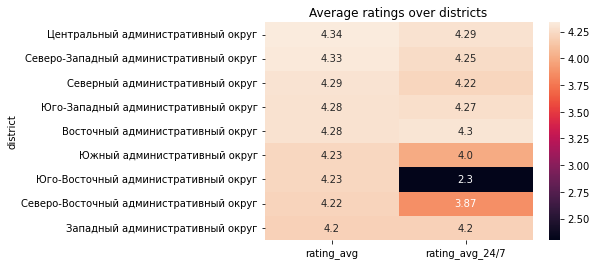

In [79]:
# create heatmap chart with ratings over districts

ax = sns.heatmap(data, annot=True, fmt='.3')
ax.set_title('Average ratings over districts');

* Overall, average coffee shops ratings over districts are in a very tiny range from 4.2 to 4.34
* The highest average ratings are again in the Central admin area
* For 24/7 working coffee shops in most of the districts, the average rating does not change much; exceptions are the South-Eastern and the North-Eastern admin areas but there are only a few 24/7 places in those districts, so it is not statistically relevant

In [80]:
# understand how many data points for median coffee cup price we have

df_coffee['middle_coffee_cup'].count()

521

In [81]:
# calc mean and median cost of cup of cuppucino in the coffee shops

df_coffee.groupby('district')['middle_coffee_cup'].agg(['mean', 'median', 'count']).sort_values(by='mean', ascending=False)

,mean,median,count
district,,,
Западный административный округ,189.94,189.00,49
Центральный административный округ,187.52,190.00,162
Юго-Западный административный округ,184.18,198.00,34
Восточный административный округ,174.02,135.00,42
Северный административный округ,165.79,159.00,76
Северо-Западный административный округ,165.52,165.00,21
Северо-Восточный административный округ,165.33,162.50,60
Южный административный округ,158.49,150.00,43
Юго-Восточный административный округ,151.09,147.50,34


In [82]:
# group data by rating and average coffee cup price

data = df_coffee.groupby('rating')['middle_coffee_cup'].mean().to_frame('avg_price').dropna()

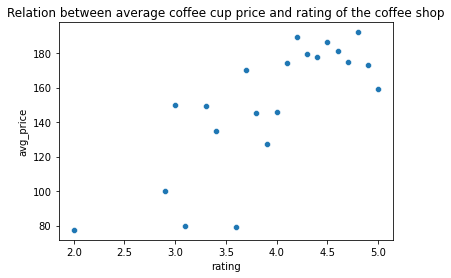

In [83]:
# create scatter plot

ax = sns.scatterplot(data=data, x='rating', y='avg_price')
ax.set_title('Relation between average coffee cup price and rating of the coffee shop');

* There are some clear clusters on the chart above
* In places with rating in range 4 to 5 the average cost of cappucino is around 180 roubles
* In places with rating in range 3 to 4 the average cost of cappucino is around 150 roubles
* It is interesting to find out what drives what: higher rating -> higher price or higher price -> higher rating

In [84]:
# check for relations b/w average coffee cup price and number of seats

data = df_coffee.groupby('seats')['middle_coffee_cup'].mean().to_frame('avg_price').dropna()

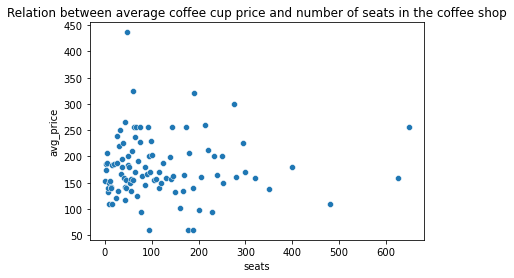

In [85]:
# create scatter plot

ax = sns.scatterplot(data=data, x='seats', y='avg_price')
ax.set_title('Relation between average coffee cup price and number of seats in the coffee shop');

* There is no clear connection b/w number of seats and average coffee cup price

In [86]:
# check streets with highest average coffee cup price

df_coffee.groupby('street')['middle_coffee_cup'].agg(['mean', 'count']).dropna().sort_values(by='mean', ascending=False).head(5)

,mean,count
street,,
Большая Семёновская улица,851.00,2
Большая Никитская улица,328.00,1
3-я Фрунзенская улица,320.00,1
Большая Сухаревская площадь,300.00,1
Богословский переулок,300.00,1


* Those streets are completely non discriptive as there are only 1 or 2 places
* We do one more groupping

In [87]:
# check streets with highest average coffee cup price

(
    df_coffee
    .groupby('street')['middle_coffee_cup']
    .agg(['mean', 'count'])
    .dropna()
    .query('count >= 5')
    .sort_values(by='mean', ascending=False)
)                                                                                                                        

,mean,count
street,,
Ленинский проспект,224.33,9
Кутузовский проспект,201.00,6
Дмитровское шоссе,194.40,5
проспект Мира,187.89,9
Ленинградский проспект,187.55,11
Профсоюзная улица,161.83,6
Усачёва улица,160.80,5
Волгоградский проспект,152.33,6
Каширское шоссе,130.80,5


Surpisingly, the streets with the highest average coffee cup prices are still not the most hip streets with the top coffee shops and hipster places 

In [88]:
# last check for relationship of working 24/7 and average coffee cup price

df_coffee.groupby('is_24/7')['middle_coffee_cup'].agg(['mean', 'count'])

,mean,count
is_24/7,,
False,173.33,505
True,225.73,15


There are too few data points for coffee shops working 24/7 and having data for average coffee cup price to say that working 24/7 a place can set higher prices for a coffee cup.

### Results

* We can not say whether to open a coffee shop or not as we do not have data with the associated costs
* But if opening one, we would get the following recommendations:  
    1) **District**: West or South-Western admin area  
    2) **Price of a coffee cup**: 185 roubles (average market price)  
    3) **is 24/7?**: No (no prove of higher revenues with high possibility of higher costs)   
    4) **Number of seats**: any (the less the better due to the costs)    
    
    
* Those are the consequences of the lower competition in that areas, but still with high average coffee cup prices and average ratings of the places
* Moreover, the rent should be lower in that districts than in the Central one